## EDA for Freesound Audio Tagging 2019 

In [1]:
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

pd.set_option('display.max_columns', 200)
pd.set_option('display.max_rows', 100)

import seaborn as sns
sns.set(font_scale=1.2)
plt.style.use('ggplot')

import IPython.display as ipd
import librosa

import warnings
warnings.simplefilter(action='ignore')

In [2]:
np.random.seed(123)
SAMPLE_RATE = 44100

## Считывание данных

In [3]:
train = pd.read_csv("/data/kaggle-freesound-2019/train_curated.csv")
train['is_curated'] = True
train_noisy = pd.read_csv('/data/kaggle-freesound-2019/train_noisy.csv')
train_noisy['is_curated'] = False
train = pd.concat([train, train_noisy], axis=0)
del train_noisy

Всего записей:

In [4]:
train.shape[0]

24785

Из них подавляющее большинство очищены:

In [5]:
train.is_curated.value_counts()

False    19815
True      4970
Name: is_curated, dtype: int64

Некоторые записи имеют несколько лейблов:

In [6]:
train.tail(3)

,fname,labels,is_curated
19812,fffd1871.wav,"Water_tap_and_faucet,Sink_(filling_or_washing)",False
19813,fffe9808.wav,Clapping,False
19814,ffff6da3.wav,Walk_and_footsteps,False


Поэтому далее будем исследовать данные в разрезе разного количества лейблов у записей.

In [7]:
train['n_label'] = train.labels.str.split(',').apply(lambda x: len(x))
train.tail(3)

,fname,labels,is_curated,n_label
19812,fffd1871.wav,"Water_tap_and_faucet,Sink_(filling_or_washing)",False,2
19813,fffe9808.wav,Clapping,False,1
19814,ffff6da3.wav,Walk_and_footsteps,False,1


Посчитаем долю записей для каждого кол-ва лейблов среди очищенных и зашумленных данных:

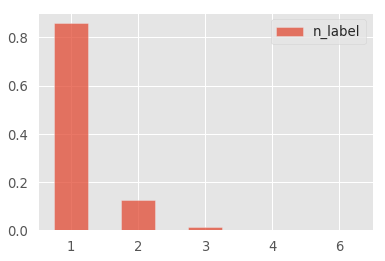

In [8]:
pd.DataFrame(train.query('is_curated == True').n_label.value_counts()/len(train.query('is_curated == True'))).plot.bar(alpha=0.75, rot=0);

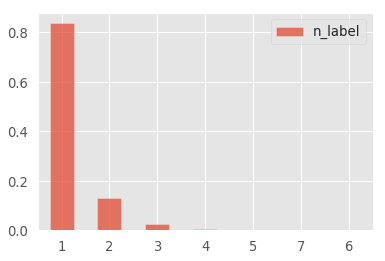

In [9]:
pd.DataFrame(train.query('is_curated == False').n_label.value_counts()/len(train.query('is_curated == False'))).plot.bar(alpha=0.75, rot=0);

Видим, что распределение кол-ва лейблов в очищенных и зашумленных данные примерно одинаковое. Однако в зашумленных данных встречаются записи, у которых 7 лейблов (в очищенных таких нет). 

## Исследование записей с 1 меткой

Построим распределение кол-ва записей, у которых 1 лейбл:

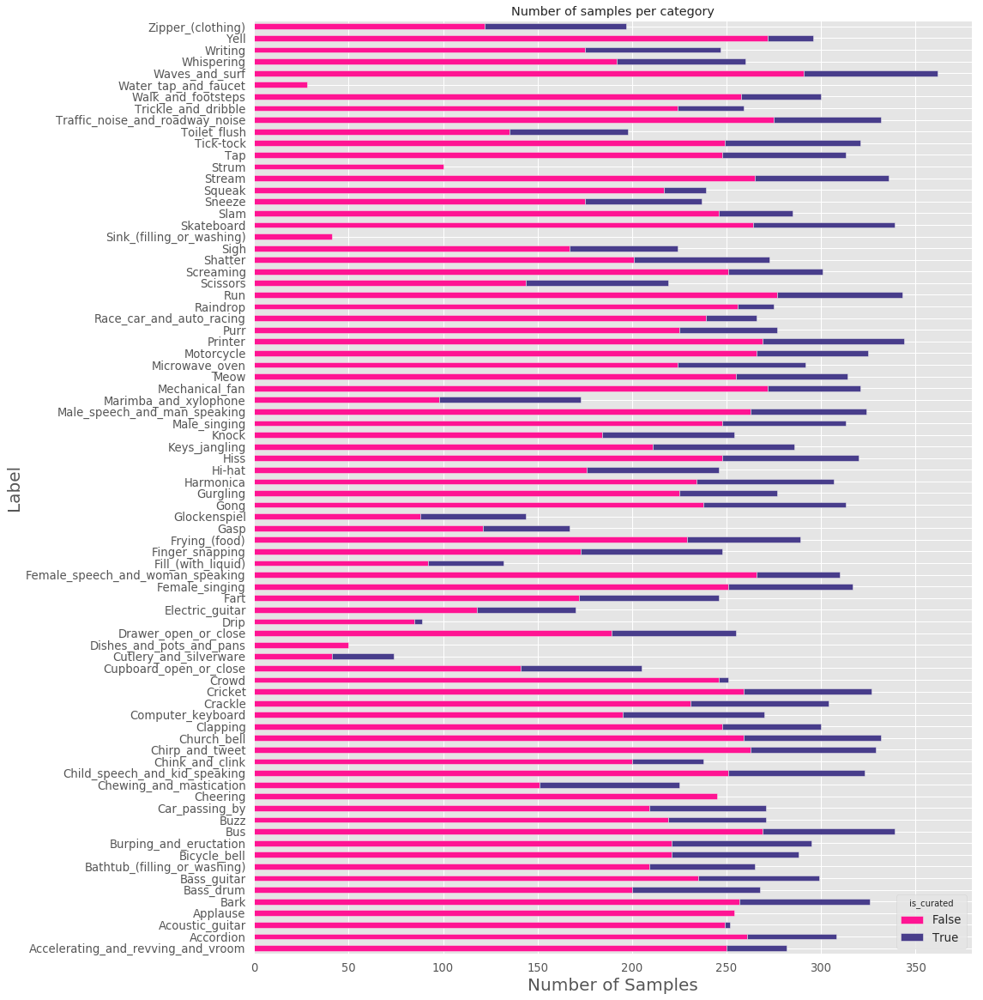

In [10]:
cat_gp = train[train.n_label == 1].groupby(
    ['labels', 'is_curated']).agg({
    'fname':'count'
}).reset_index()
cat_gpp = cat_gp.pivot(index='labels', columns='is_curated', values='fname').reset_index().set_index('labels')

plot = cat_gpp.plot(
    kind='barh',
    title="Number of samples per category",
    stacked=True,
    color=['deeppink', 'darkslateblue'],
    figsize=(15,20))
plot.set_xlabel("Number of Samples", fontsize=20)
plot.set_ylabel("Label", fontsize=20);

Видим, что некоторые теги есть только в неочищенных записях.

Далее воспроизведем некоторые примеры:

Очищенные:

In [11]:
# sampling an audio in train_curated
samp = train[(train.n_label == 1) & (train.is_curated == True)].head(1)
print(samp.labels.values[0])
ipd.Audio('/data/kaggle-freesound-2019/train_curated/{}'.format(samp.fname.values[0]))

Bark


Неочищенные:

In [12]:
# sampling an audio in train_noisy
samp_n = train[(train.n_label == 1) & 
               (train.is_curated == False) & 
               (train.labels == samp.labels.values[0])].head(1)
print(samp_n.labels.values[0])
ipd.Audio('/data/kaggle-freesound-2019/train_noisy/{}'.format(samp_n.fname.values[0]))

Bark


Для обоих примеров обрежем тихую часть в начале и конце и построим графики mel-scaled спректрограмм и mfcc:

In [13]:
def subplot_curated_noisy(x1, x2, samp1, samp2):
    fig, ax = plt.subplots(2, 1, figsize=(15, 10))
    for i, m in enumerate([x1, x2]):
        if i==0: 
            ax[i].set_title('Curated: {}'.format(samp1.labels.values[0]))
        else:
            ax[i].set_title('Noisy: {}'.format(samp2.labels.values[0]))
        im = ax[i].imshow(m, cmap='Spectral', interpolation='nearest', aspect=m.shape[1]/m.shape[0]/5)

In [14]:
def melspectrogram_mfcc(samp, samp_n, two=True, melsp=False, mfc=False):
    
    if two == True:
    # trim silent part
        wav, _ = librosa.core.load(
            '/data/kaggle-freesound-2019/train_curated/{}'.format(samp.fname.values[0]),
            sr=SAMPLE_RATE)
        wav_tr = librosa.effects.trim(wav)[0]
        print('After trimmed curated wav: {:,}/{:,}'.format(len(wav_tr), len(wav)))

        wav_n, _ = librosa.core.load(
            '/data/kaggle-freesound-2019/train_noisy/{}'.format(samp_n.fname.values[0]),
            sr=SAMPLE_RATE)
        wav_tr_n = librosa.effects.trim(wav_n)[0]
        print('After trimmed noisy wav: {:,}/{:,}'.format(len(wav_tr_n), len(wav_n)))
    else:
        wav, _ = librosa.core.load(
            '/data/kaggle-freesound-2019/train_curated/{}'.format(samp.fname.values[0]),
            sr=SAMPLE_RATE)
        wav_tr = librosa.effects.trim(wav)[0]
        print('After trimmed curated wav: {:,}/{:,}'.format(len(wav_tr), len(wav)))
    
    if melsp == True and two == True:
        melspec = librosa.feature.melspectrogram(
            librosa.resample(wav_tr, SAMPLE_RATE, SAMPLE_RATE/2),
            sr=SAMPLE_RATE/2,
            n_fft=1764,
            hop_length=220,
            n_mels=64
        )
        logmel = librosa.core.power_to_db(melspec)
    
        melspec_n = librosa.feature.melspectrogram(
            librosa.resample(wav_tr_n, SAMPLE_RATE, SAMPLE_RATE/2),
            sr=SAMPLE_RATE/2,
            n_fft=1764,
            hop_length=220,
            n_mels=64
        )
        logmel_n = librosa.core.power_to_db(melspec_n)
        subplot_curated_noisy(logmel, logmel_n, samp, samp_n)
        
    if melsp == True and two == False:
        melspec = librosa.feature.melspectrogram(
            librosa.resample(wav_tr, SAMPLE_RATE, SAMPLE_RATE/2),
            sr=SAMPLE_RATE/2,
            n_fft=1764,
            hop_length=220,
            n_mels=64
        )
        logmel = librosa.core.power_to_db(melspec)
        fig, ax = plt.subplots(figsize=(15, 5))
        im = ax.imshow(logmel, cmap='Spectral', interpolation='nearest',
                  aspect=logmel.shape[1]/logmel.shape[0]/5)
        ax.set_title('log-mel');
        
    
    if mfc == True and two == True:
        mfcc = librosa.feature.mfcc(wav_tr, 
                                    sr=SAMPLE_RATE, 
                                    n_fft=1764,
                                    hop_length=220,
                                    n_mfcc=64)
        mfcc_n = librosa.feature.mfcc(wav_tr_n, 
                                      sr=SAMPLE_RATE, 
                                      n_fft=1764,
                                      hop_length=220,
                                      n_mfcc=64)

        subplot_curated_noisy(mfcc, mfcc_n, samp, samp_n)
        
    if mfc == True and two == False:
        mfcc = librosa.feature.mfcc(wav_tr, 
                                    sr=SAMPLE_RATE, 
                                    n_fft=1764,
                                    hop_length=220,
                                    n_mfcc=64)
        fig, ax = plt.subplots(figsize=(15, 5))
        im = ax.imshow(mfcc, cmap='Spectral', interpolation='nearest',
                  aspect=mfcc.shape[1]/mfcc.shape[0]/5)
        ax.set_title('MFCC');

After trimmed curated wav: 310,456/310,456
After trimmed noisy wav: 363,008/364,544


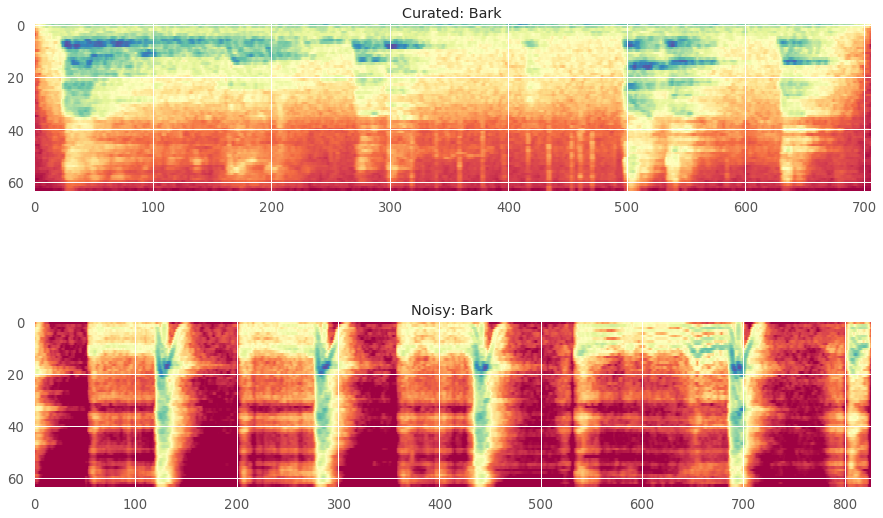

In [15]:
melspectrogram_mfcc(samp, samp_n, two=True, melsp=True, mfc=False)

After trimmed curated wav: 310,456/310,456
After trimmed noisy wav: 363,008/364,544


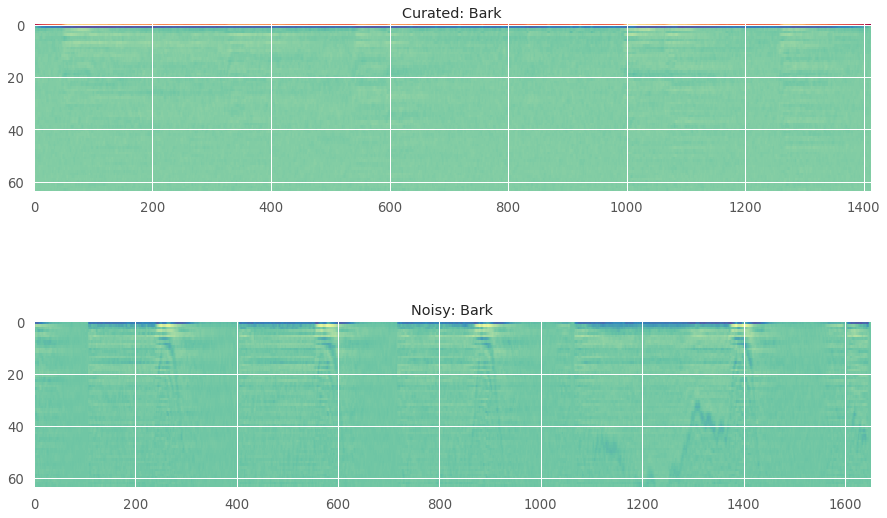

In [16]:
melspectrogram_mfcc(samp, samp_n, two=True, melsp=False, mfc=True)

## Исследование записей с несколькими метками (больше 1)

Приведем примеры таких записей:

In [17]:
np.random.seed(123)

label_set = set(train.loc[(train.n_label == 2) & (train.is_curated == True), 'labels']) & set(
    train.loc[(train.n_label == 2) & (train.is_curated == False), 'labels'])

label_samp = np.random.choice(list(label_set), 1)[0]
samp = train[(train.labels == label_samp) & (train.is_curated == True)].sample(1)
print(label_samp)
ipd.Audio('/data/kaggle-freesound-2019/train_curated/{}'.format(samp.fname.values[0]))

Applause,Cheering


Лейблы соответствуют описанию.

In [18]:
# sampling an audio in train_noisy
np.random.seed(11291)
samp_n = train[(train.labels == label_samp) & (train.is_curated == False)].sample(1)
print(samp_n.labels.values[0])
ipd.Audio('/data/kaggle-freesound-2019/train_noisy/{}'.format(samp_n.fname.values[0]))

Applause,Cheering


Лейблы не соотвтествуют описанию, запись скорее похожа на крик, вопль или плач, а не на метки, которые ей приписаны в данных.

After trimmed curated wav: 499,792/499,792
After trimmed noisy wav: 661,500/661,500


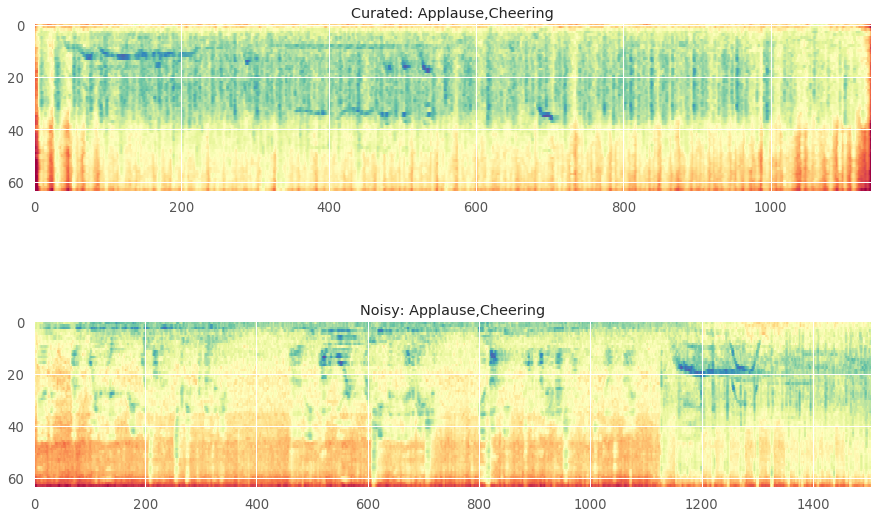

In [19]:
melspectrogram_mfcc(samp, samp_n, two=True, melsp=True, mfc=False)

After trimmed curated wav: 499,792/499,792
After trimmed noisy wav: 661,500/661,500


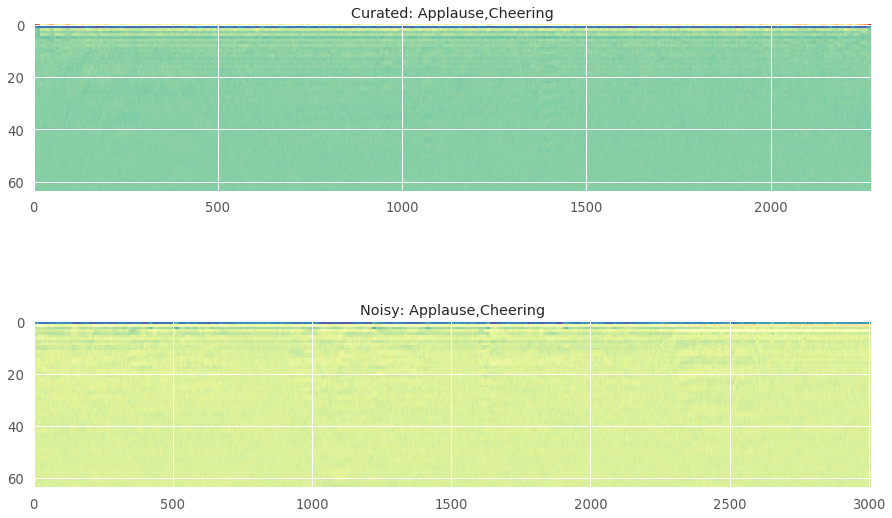

In [20]:
melspectrogram_mfcc(samp, samp_n, two=True, melsp=False, mfc=True)

Найдем другой пример несоответствий меток и фактической записи:

In [21]:
np.random.seed(9144440)
samp = train[train.n_label == 5].sample(1)
print(samp.labels.values[0])
ipd.Audio('/data/kaggle-freesound-2019/train_noisy/{}'.format(samp.fname.values[0]))

Zipper_(clothing),Squeak,Sigh,Chewing_and_mastication,Crackle


In [22]:
np.random.seed(199)
samp = train[train.n_label == 6].sample(1)
print(samp.labels.values[0])
ipd.Audio('/data/kaggle-freesound-2019/train_noisy/{}'.format(samp.fname.values[0]))

Writing,Computer_keyboard,Tick-tock,Chewing_and_mastication,Keys_jangling,Scissors


В записе выше также нет звука печетания на клавиатуре и письма.

Как видно выше, многие метки зашумленных записей присвоены записям __некорректно__. Поэтому дальнейший анализ будем проводить только на очищенных метках.

Теперь построим распределение всех меток, приписанных очищенным записям:

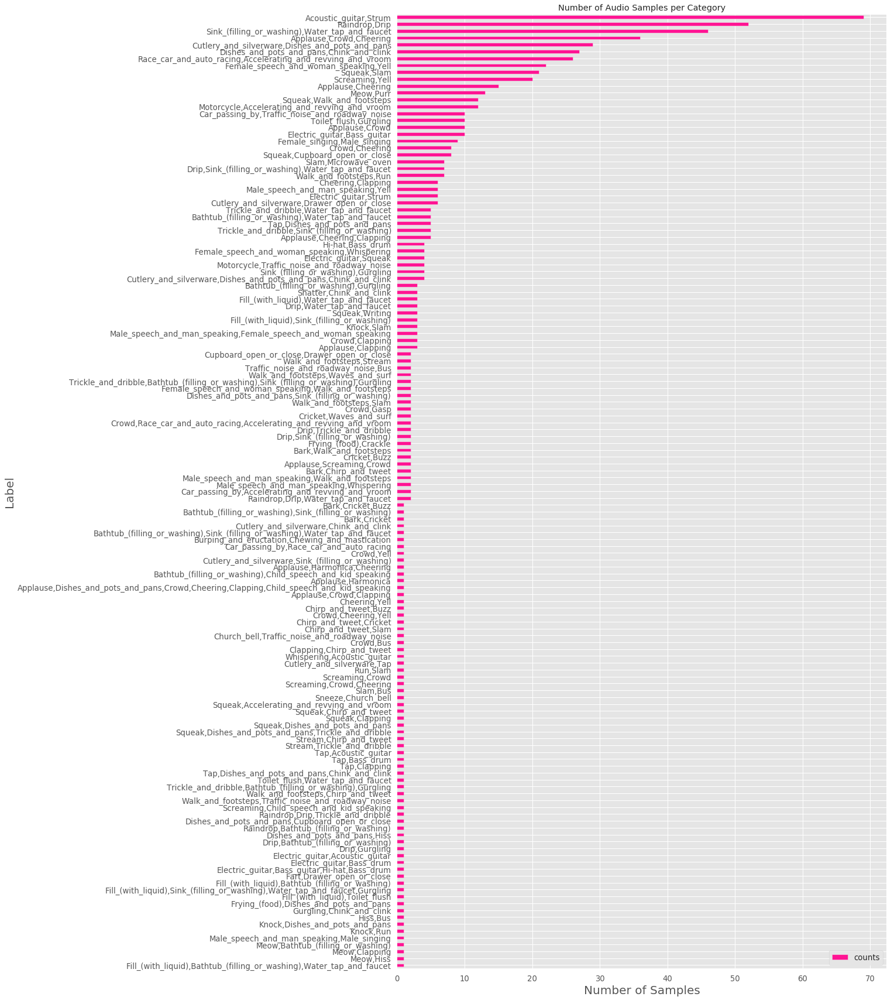

In [23]:
cat_gp = train[(train.n_label > 1) & (train.is_curated == True)].groupby(
    'labels').agg({'fname':'count'})
cat_gp.columns = ['counts']

plot = cat_gp.sort_values(ascending=True, by='counts').plot(
    kind='barh',
    title="Number of Audio Samples per Category",
    color='deeppink',
    figsize=(15,30))
plot.set_xlabel("Number of Samples", fontsize=20)
plot.set_ylabel("Label", fontsize=20);

Из графика видим, что примерно половна multy-label категорий имеет всего одну аудиозапись.

Далее изучим совместную встречаемость меток в записях. Дополнительно кластеризуем наблюдения:

In [24]:
test = pd.read_csv('/data/kaggle-freesound-2019/sample_submission.csv')
for c in test.columns[1:]:
    cc = c.replace('(', '\(').replace(')', '\)')
    train.loc[:, c] = train['labels'].str.contains(cc)
    if (train.loc[:, c] > 1).sum():
        raise Exception('label key "{}" are duplicated !'.format(c))

In [25]:
multi_label = test.columns[1:][train.loc[
    (train.n_label > 1) & (train.is_curated == True), test.columns[1:]].sum() > 0]

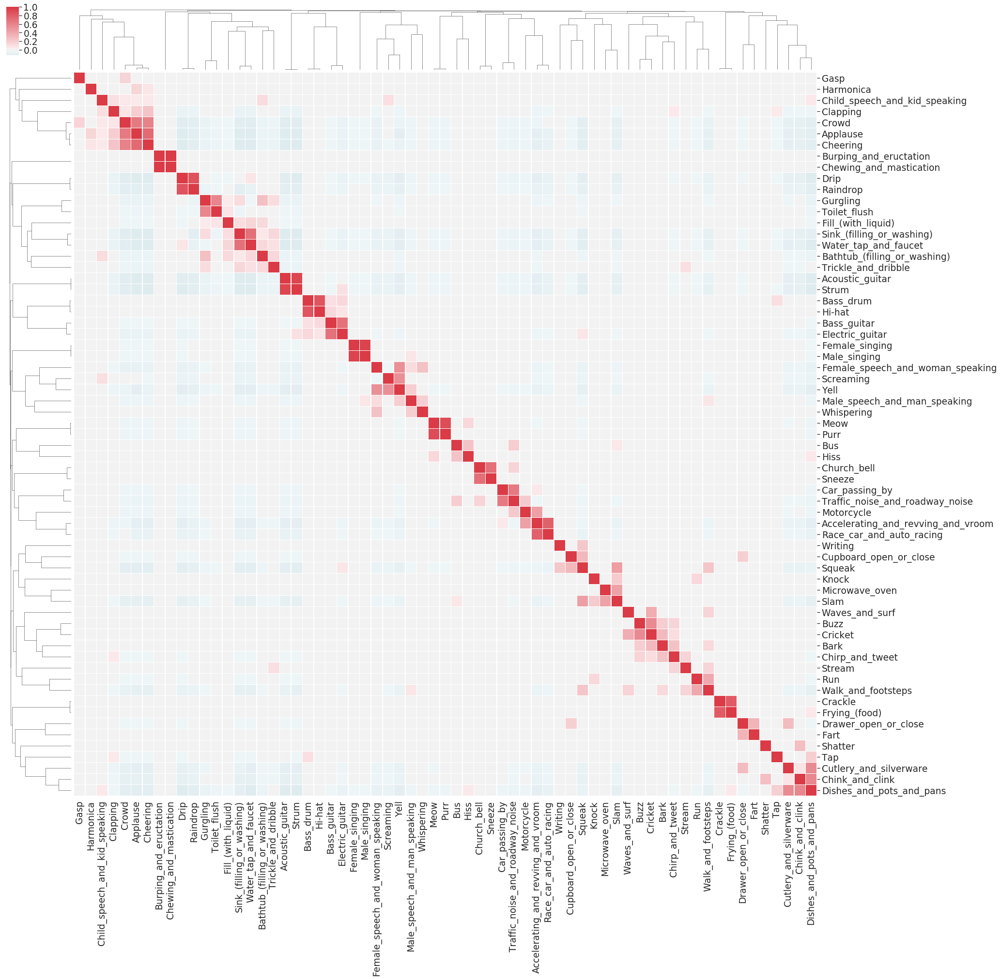

In [26]:
cmap = sns.diverging_palette(220, 10, as_cmap=True)
sns.set(font_scale=1.7)
train_cor = train.loc[
    (train.n_label > 1) & (train.is_curated == True), multi_label].corr()
mask = np.zeros_like(train_cor, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
sns.clustermap(train_cor, metric='correlation',
               cmap=cmap, center=0, linewidths=.5, figsize=(30, 30));

Из графика выше видно, что высокая корреляция наблюдаетя у довольно забавных категория, например, у женской речи, крика и вопля.

Таким образом, основной вывод, который можно сделать из анализа выше, -- это то, что зашемленных данных встречаются записи, метки к которым проставлены некорректно. Это потенциально плохо скажется на результате обучения.

### Использованные источники

1. https://www.kaggle.com/kernels/scriptcontent/12843019/download 